In [1]:
import librosa
import numpy as np
import matplotlib.pyplot as plt
import IPython.display as ipd
from librosa import display

from utils import noiseChannel, to_history_matrix
from filters import LMSFilter

# Sine Wave (Sanity Check)

In [2]:
N = 5000
n = 10
x = np.sin(np.arange(0, N/10., N/50000.))
xn, n0, _ = noiseChannel(x, sigma_n=25)
print(x.shape)
print(xn.shape)
print(n0.shape)

n0 = to_history_matrix(n0, n)[:-1]
print(n0.shape)

xn, x = xn[n:], x[n:]
print(xn.shape)
print(x.shape)

(5000,)
(5000,)
(5000,)
(4990, 10)
(4990,)
(4990,)


In [3]:
lms = LMSFilter(n=n, mu=1E-3, w="zeros")
y, e, w = lms.fit(n0, xn)

mse_xn = np.mean(np.square(x - xn))
mse_y = np.mean(np.square(x - y))

print("Noisy/Original MSE", mse_xn)
print("Filtered/Original MSE", mse_y)
print("Filter Coefficients\n", w)

100%|██████████| 4990/4990 [00:00<00:00, 153226.96it/s]

Fitting LMS Filter
Noisy/Original MSE 25.08291722830575
Filtered/Original MSE 4.396166055588498
Filter Coefficients
 [-0.03095269 -0.00665925  0.03760543  0.01235371  0.06782285  0.00305188
 -0.25726545 -0.04298061 -0.14826451  0.18229456]


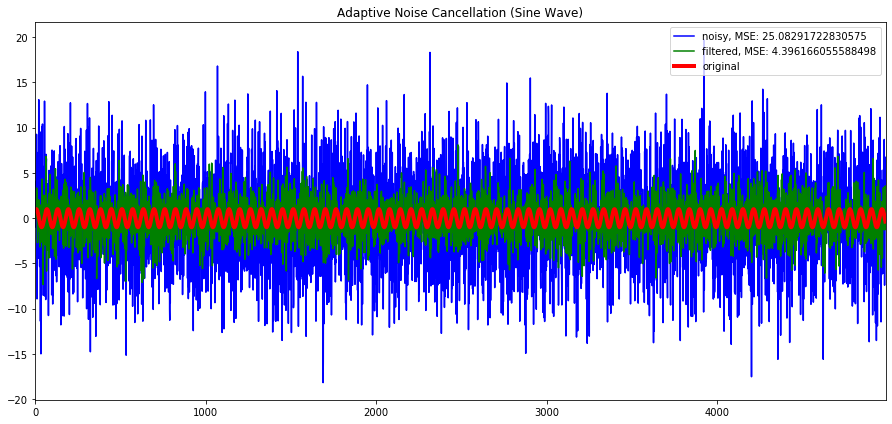

In [4]:
plt.figure(figsize=(12.5,6))
plt.plot(xn, "b", label="noisy, MSE: {}".format(mse_xn))
plt.plot(y, "g", label="filtered, MSE: {}".format(mse_y))
plt.plot(x, "r", linewidth=4, label="original")
plt.title('Adaptive Noise Cancellation (Sine Wave)')
plt.xlim(0, N-n)
plt.legend()
plt.tight_layout()
plt.show()

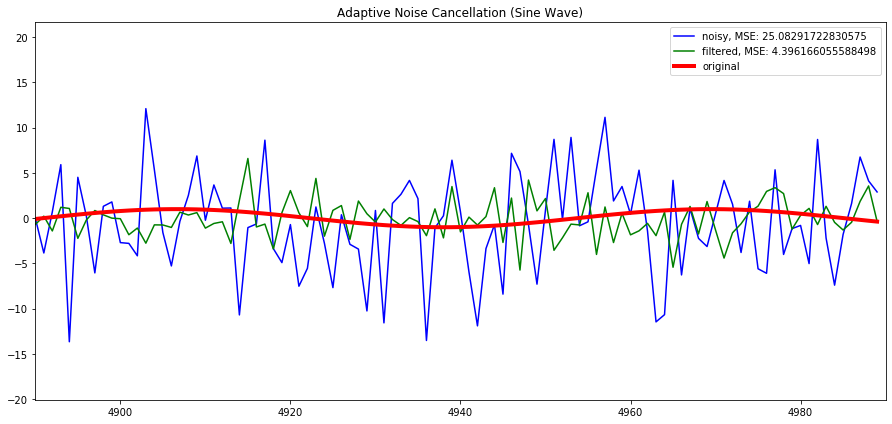

In [5]:
plt.figure(figsize=(12.5,6))
plt.plot(xn, "b", label="noisy, MSE: {}".format(mse_xn))
plt.plot(y, "g", label="filtered, MSE: {}".format(mse_y))
plt.plot(x, "r", linewidth=4, label="original")
plt.title('Adaptive Noise Cancellation (Sine Wave)')
plt.xlim(N-n-100,N-n)
plt.legend()
plt.tight_layout()
plt.show()

# Audio Signal

In [1]:
import librosa
import numpy as np
import matplotlib.pyplot as plt
import IPython.display as ipd
from librosa import display

from utils import noiseChannel, to_history_matrix
from filters import LMSFilter

file_path = "ImperialMarch60.wav"

x, sr = librosa.load(file_path)
print("Signal Shape:", x.shape)
print("Sampling Rate:", sr)

ipd.Audio(x, rate=sr)

Signal Shape: (1323000,)
Sampling Rate: 22050


Text(0.5, 1.0, 'Original Audio Signal Spectrogram')

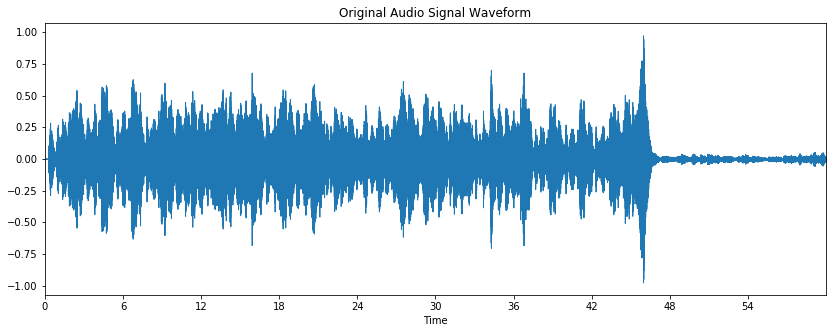

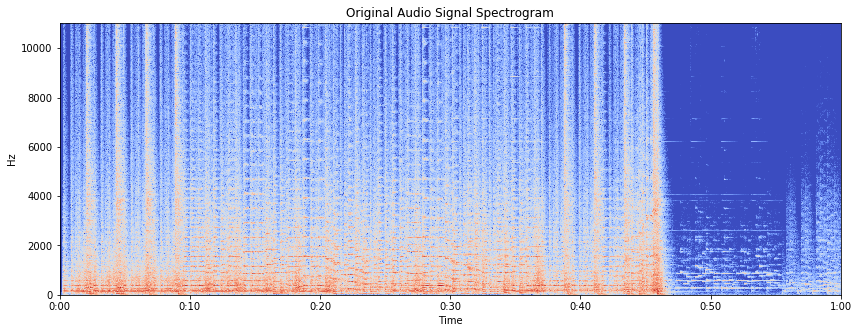

In [2]:
plt.figure(figsize=(14, 5))
librosa.display.waveplot(x, sr=sr)
plt.title("Original Audio Signal Waveform")

X = librosa.stft(x)
Xdb = librosa.amplitude_to_db(abs(X))
plt.figure(figsize=(14, 5))
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
plt.title("Original Audio Signal Spectrogram")

In [3]:
N = len(x)
n = 50
sigma_n = 0.01
xn, n0, _ = noiseChannel(x, sigma_n=sigma_n)
print(x.shape)
print(xn.shape)
print(n0.shape)

ipd.Audio(xn, rate=sr)

(1323000,)
(1323000,)
(1323000,)


Text(0.5, 1.0, 'Noisy Audio Signal Spectrogram')

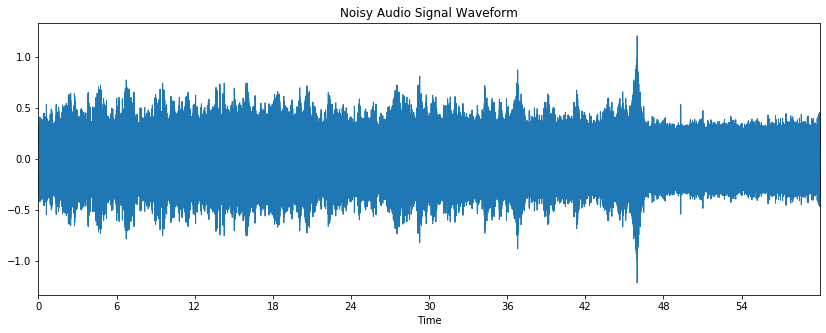

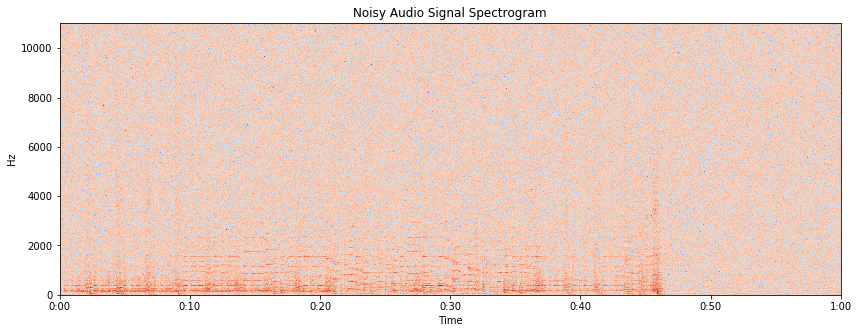

In [4]:
plt.figure(figsize=(14, 5))
librosa.display.waveplot(xn, sr=sr)
plt.title("Noisy Audio Signal Waveform")

Xn = librosa.stft(xn)
Xndb = librosa.amplitude_to_db(abs(Xn))
plt.figure(figsize=(14, 5))
librosa.display.specshow(Xndb, sr=sr, x_axis='time', y_axis='hz')
plt.title("Noisy Audio Signal Spectrogram")

In [5]:
n0 = to_history_matrix(n0, n)[:-1]
print(n0.shape)

xn = xn[n:]
x = x[n:]
print(xn.shape)
print(x.shape)

(1322950, 50)
(1322950,)
(1322950,)


In [6]:
lms = LMSFilter(n=n, mu=1E-1, w="zeros", sigma=0.01)
y_hat, e, w = lms.fit(n0, xn)
y = xn - y_hat

mse_xn = np.mean(np.square(x - xn))
mse_y = np.mean(np.square(x - y))
print("Noisy/Original MSE", mse_xn)
print("Filtered/Original MSE", mse_y)

print("Filter Coefficients\n", w)

  3%|▎         | 43190/1322950 [00:00<00:05, 215462.42it/s]

Fitting LMS Filter


100%|██████████| 1322950/1322950 [00:05<00:00, 222129.84it/s]

Noisy/Original MSE 0.009999566184857173
Filtered/Original MSE 0.010472738753724002
Filter Coefficients
 [-0.00815021 -0.02750548  0.00886428 -0.01649254  0.03099026  0.01008555
 -0.02799931 -0.00870922  0.00466452 -0.03248338  0.03335421 -0.00282752
 -0.01984403 -0.02088521  0.02876037 -0.03717346 -0.05116372 -0.00408686
  0.03114808 -0.00202893  0.00938405 -0.00601921  0.0311804   0.01604918
 -0.03332839  0.02759894 -0.02455768 -0.00371795  0.00488294  0.00183338
 -0.01089524  0.02140371  0.04827442 -0.03911437  0.0082664  -0.04238813
 -0.03502432  0.01764397  0.00704384  0.0056214   0.01796034 -0.01291398
  0.01923348 -0.00187555 -0.00681436  0.00654063  0.0029707  -0.03207667
  0.03732949  0.03346694]


Text(0.5, 1.0, 'Filtered Audio Signal Spectrogram')

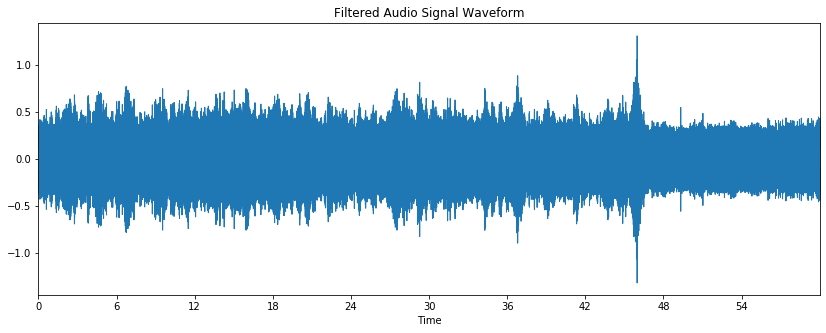

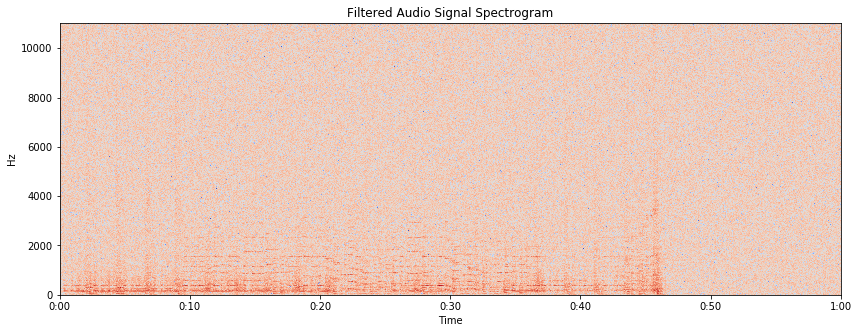

In [7]:
plt.figure(figsize=(14, 5))
librosa.display.waveplot(y, sr=sr)
plt.title("Filtered Audio Signal Waveform")

Y = librosa.stft(y)
Ydb = librosa.amplitude_to_db(abs(Y))
plt.figure(figsize=(14, 5))
librosa.display.specshow(Ydb, sr=sr, x_axis='time', y_axis='hz')
plt.title("Filtered Audio Signal Spectrogram")

In [8]:
ipd.Audio(y, rate=sr)

/Users/icorley/miniconda3/envs/dspenv/lib/python3.7/site-packages/ipykernel_launcher.py:7: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  import sys
/Users/icorley/miniconda3/envs/dspenv/lib/python3.7/site-packages/IPython/core/pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


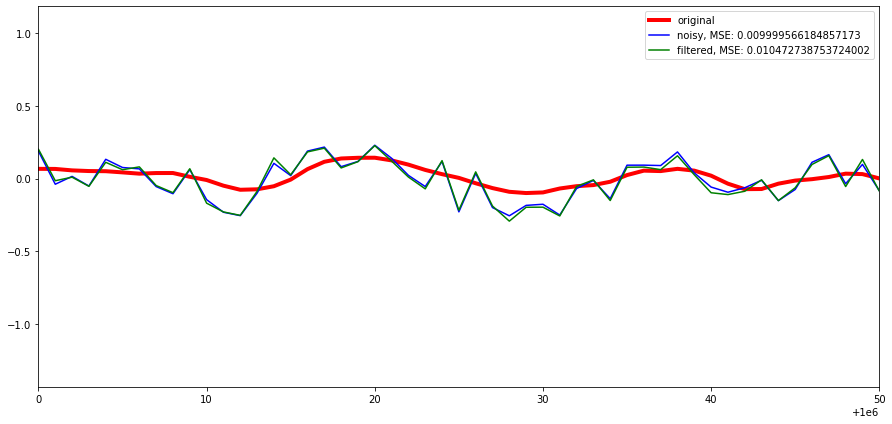

In [9]:
plt.figure(figsize=(12.5,6))
plt.plot(x, "r", linewidth=4, label="original")
plt.plot(xn, "b", label="noisy, MSE: {}".format(mse_xn))
plt.plot(y, "g", label="filtered, MSE: {}".format(mse_y))
plt.xlim(1000000, 1000050)
plt.legend()
plt.tight_layout()
plt.show()